In [1]:
%reload_ext autoreload
%autoreload 2
%matplotlib inline

In [2]:
import warnings
warnings.filterwarnings("ignore", category=UserWarning)

In [3]:
import numpy as np
from tqdm import tqdm
from pathlib import Path
import openslide
import pandas as pd

In [4]:
from fastai.callbacks.csv_logger import CSVLogger

In [5]:
from object_detection_fastai.helper.object_detection_helper import *
from object_detection_fastai.helper.wsi_loader import *
from object_detection_fastai.loss.RetinaNetFocalLoss import RetinaNetFocalLoss
from object_detection_fastai.models.RetinaNet import RetinaNet
from object_detection_fastai.callbacks.callbacks import BBLossMetrics, BBMetrics, PascalVOCMetric, PascalVOCMetricByDistance

In [6]:
slides_train = list(set(["03_EIPH_566933 R Turnbull blue.svs", 
                         "22_EIPH_575216 Turnbull blue.svs", 
                         "27_EIPH_571557 berliner blau.svs", 
                         "15_EIPH_568320 Turnbull blue.svs", 
                         "17_EIPH_575796 Berliner Blau.svs", 
                        ]))

slides_val = list(set(["14_EIPH_568381 berliner blau-001.svs", "01_EIPH_563479 Turnbull blue.svs" ]))

In [7]:
grade_list = [0, 1]
annotations_path = Path("../../Statistics/EIPH_Annotations.pkl")
annotations = pd.read_pickle(annotations_path)
annotations["image_name"] = [name.replace("tiff","svs") for name in annotations["image_name"]]
annotations = annotations[annotations["grade"].isin(grade_list)]
annotations_train = annotations[annotations["image_name"].isin(slides_train)]
annotations_val = annotations[annotations["image_name"].isin(slides_val)]
annotations_train.head()

,id,image_id,image_set,species,image_name,image_type,grade,vector,unique_identifier,user_id,deleted,last_editor,data_set_name,version
105389,1417177,3526,245,equine,14_EIPH_568381 Turnbull blue.svs,TurnbullBlue,0,"{'x1': 17958, 'x2': 18042, 'y1': 4266, 'y2': 4...",b37370a6-d4c9-48e1-ad11-1ce32c895513,1,False,1,SREP,SREP_V2
105390,1417178,3526,245,equine,14_EIPH_568381 Turnbull blue.svs,TurnbullBlue,0,"{'x1': 17999, 'x2': 18113, 'y1': 4245, 'y2': 4...",01c4de6f-2641-4696-a971-cb62b0dca32e,1,False,1,SREP,SREP_V2
105391,1417188,3526,245,equine,14_EIPH_568381 Turnbull blue.svs,TurnbullBlue,0,"{'x1': 17715, 'x2': 17803, 'y1': 4550, 'y2': 4...",14d331ee-a150-48e2-a405-fea2dc4caca8,1,True,1,SREP,SREP
105392,1417189,3526,245,equine,14_EIPH_568381 Turnbull blue.svs,TurnbullBlue,0,"{'x1': 17780, 'x2': 17886, 'y1': 4793, 'y2': 4...",9049128f-0afe-4d66-8659-ef74a1dd911f,1,True,1,SREP,SREP
105393,1417197,3526,245,equine,14_EIPH_568381 Turnbull blue.svs,TurnbullBlue,0,"{'x1': 18905, 'x2': 19011, 'y1': 4702, 'y2': 4...",02747511-c950-40d9-b72a-d84ce8ede147,1,False,1,SREP,SREP_V2


In [8]:
slides_path = Path("../../../Slides")
files = {slide.name: slide for slide in slides_path.rglob("*.svs")  if slide.name in slides_train + slides_val}
files

{'01_EIPH_563479 Berliner Blau.svs': PosixPath('../../../Slides/Equine/01_EIPH_563479 Berliner Blau.svs'),
 '02_EIPH_574162 berliner blau.svs': PosixPath('../../../Slides/Equine/02_EIPH_574162 berliner blau.svs'),
 '11_EIPH_575697 Berliner Blau.svs': PosixPath('../../../Slides/Equine/11_EIPH_575697 Berliner Blau.svs'),
 '14_EIPH_568381 Turnbull blue.svs': PosixPath('../../../Slides/Equine/14_EIPH_568381 Turnbull blue.svs'),
 '20_EIPH_576150 berliner blau.svs': PosixPath('../../../Slides/Equine/20_EIPH_576150 berliner blau.svs'),
 '22_EIPH_575216 Turnbull blue.svs': PosixPath('../../../Slides/Equine/22_EIPH_575216 Turnbull blue.svs'),
 '26_EIPH_566482 L Berliner Blau.svs': PosixPath('../../../Slides/Equine/26_EIPH_566482 L Berliner Blau.svs'),
 '28_EIPH_569948 L Turnbull blue.svs': PosixPath('../../../Slides/Equine/28_EIPH_569948 L Turnbull blue.svs')}

In [9]:
size = 1024 
level = 0
bs = 16
train_images = 2500
val_images = 1500
experiment_name = "EquineVsEquine-L0"

In [10]:
train_files = []
val_files = []

for image_name in annotations_train["image_name"].unique():
    
    annotations = annotations_train[annotations_train["image_name"] == image_name]
    annotations = annotations[annotations["deleted"] == False]
    
    slide_path = files[image_name]
    labels =  list(annotations["grade"])
    bboxes = [[vector["x1"], vector["y1"], vector["x2"], vector["y2"]] for vector in annotations["vector"]]
    
    train_files.append(SlideContainer(slide_path, y=[bboxes, labels],  level=level, width=size, height=size))
    
for image_name in annotations_val["image_name"].unique():
    
    annotations = annotations_val[annotations_val["image_name"] == image_name]
    annotations = annotations[annotations["deleted"] == False]
    
    slide_path = files[image_name]
    labels =  list(annotations["grade"])
    bboxes = [[vector["x1"], vector["y1"], vector["x2"], vector["y2"]] for vector in annotations["vector"]]
    
    val_files.append(SlideContainer(slide_path, y=[bboxes, labels],  level=level, width=size, height=size))
    
train_files = list(np.random.choice(train_files, train_images))
valid_files = list(np.random.choice(val_files, val_images))

In [11]:
tfms = get_transforms(do_flip=True,
                      flip_vert=True,
                      #max_rotate=90,
                      max_lighting=0.0,
                      max_zoom=1.,
                      max_warp=0.0,
                      p_affine=0.5,
                      p_lighting=0.0,
                      #xtra_tfms=xtra_tfms,
                     )
tfms

([RandTransform(tfm=TfmCrop (crop_pad), kwargs={'row_pct': (0, 1), 'col_pct': (0, 1), 'padding_mode': 'reflection'}, p=1.0, resolved={}, do_run=True, is_random=True),
  RandTransform(tfm=TfmAffine (dihedral_affine), kwargs={}, p=1.0, resolved={}, do_run=True, is_random=True),
  RandTransform(tfm=TfmAffine (rotate), kwargs={'degrees': (-10.0, 10.0)}, p=0.5, resolved={}, do_run=True, is_random=True)],
 [RandTransform(tfm=TfmCrop (crop_pad), kwargs={}, p=1.0, resolved={}, do_run=True, is_random=True)])

In [12]:
def get_y_func(x):
    return x.y

In [13]:
train =  ObjectItemListSlide(train_files, path=slides_path)
valid = ObjectItemListSlide(valid_files, path=slides_path)
item_list = ItemLists(slides_path, train, valid)
lls = item_list.label_from_func(get_y_func, label_cls=SlideObjectCategoryList) #
lls = lls.transform(tfms, tfm_y=True, size=size)
data = lls.databunch(bs=bs, collate_fn=bb_pad_collate).normalize()

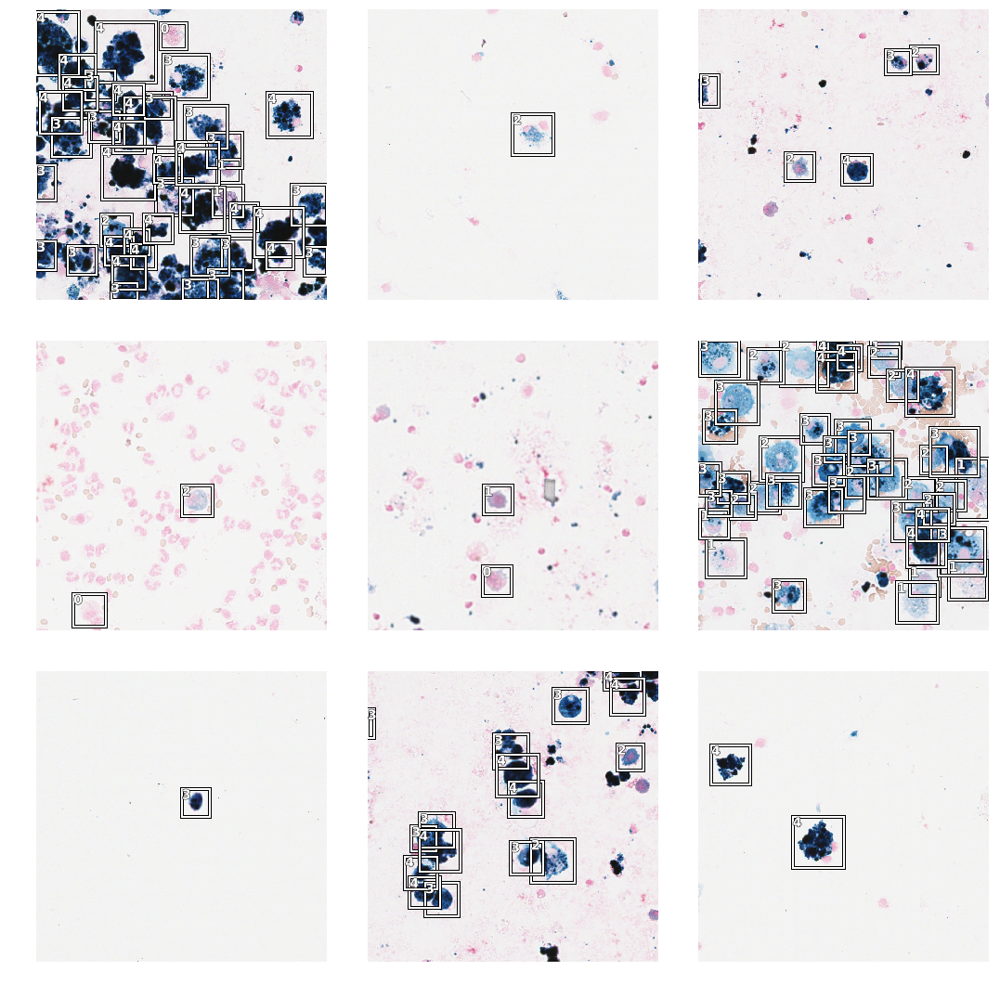

In [14]:
data.show_batch(rows=3, ds_type=DatasetType.Train, figsize=(15,15))

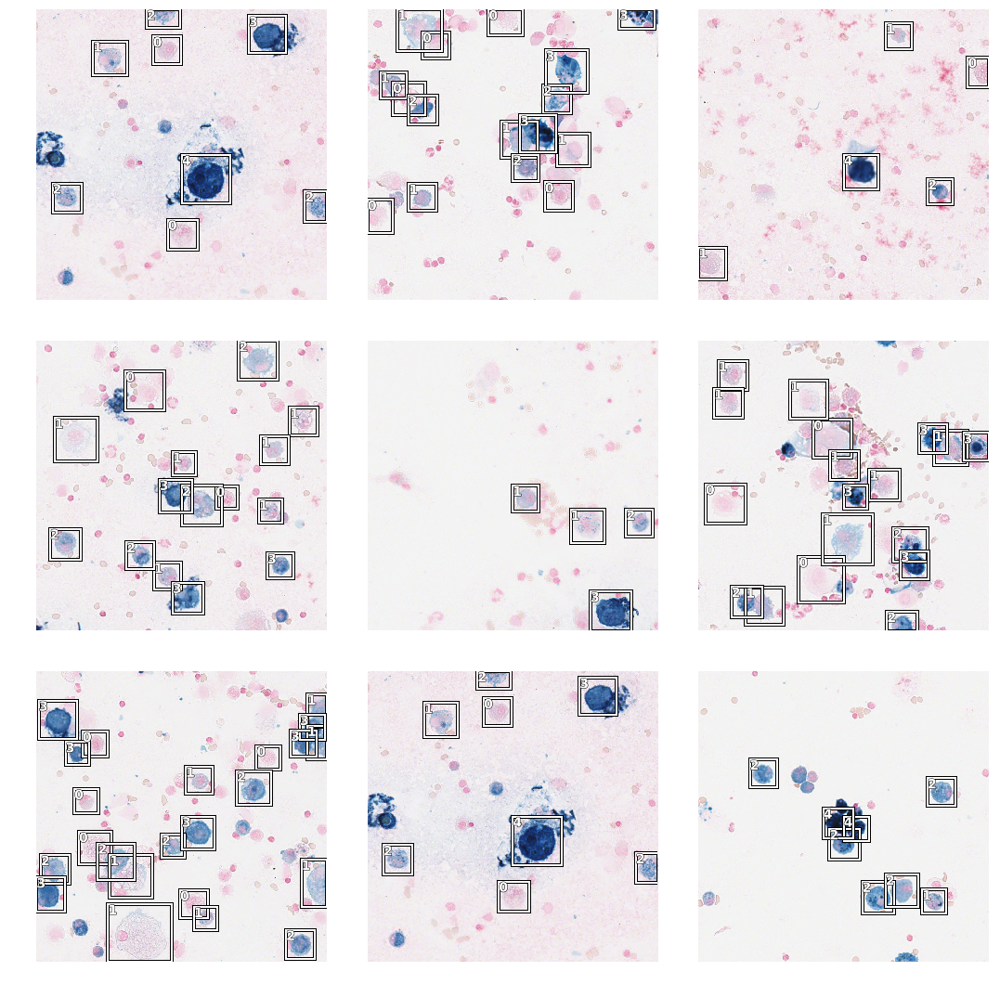

In [24]:
data.show_batch(rows=3, ds_type=DatasetType.Valid, figsize=(15,15))

In [15]:
anchors = create_anchors(sizes=[(32,32)], ratios=[1], scales=[0.6, 0.7, 0.9, 1.25, 1.5])

In [16]:
crit = RetinaNetFocalLoss(anchors)
encoder = create_body(models.resnet18, True, -2)
model = RetinaNet(encoder, n_classes=data.train_ds.c, n_anchors=5, sizes=[32], chs=128, final_bias=-4., n_conv=3)

In [17]:
voc = PascalVOCMetricByDistance(anchors, size, [str(i) for i in data.train_ds.y.classes[1:]], radius=40)
learn = Learner(data, model, loss_func=crit, callback_fns=[BBMetrics, partial(CSVLogger, append=False, filename=experiment_name)], #BBMetrics, ShowGraph
                metrics=[voc]
               )

In [18]:
learn.split([model.encoder[6], model.c5top5])
learn.freeze_to(-2)

In [20]:
learn.unfreeze()
learn.fit_one_cycle(10, 1e-3)

epoch,train_loss,valid_loss,pascal_voc_metric_by_distance,BBloss,focal_loss,AP-0,AP-1,AP-2,AP-3,AP-4,time
0,0.287210,0.297208,0.619014,0.065142,0.232067,0.670794,0.698351,0.615826,0.438662,0.671439,04:11
1,0.353822,0.389313,0.487124,0.078226,0.311086,0.616978,0.462054,0.422303,0.524357,0.409930,04:09
2,0.364286,0.379203,0.353761,0.070798,0.308406,0.072725,0.444028,0.564251,0.441140,0.246663,04:18
3,0.337735,0.310003,0.607926,0.067874,0.242129,0.630900,0.500029,0.650255,0.444913,0.813533,04:12
4,0.305934,0.443934,0.436381,0.122068,0.321866,0.639614,0.595802,0.652310,0.179618,0.114562,04:11
5,0.274619,0.263116,0.629325,0.060626,0.202490,0.696695,0.671017,0.620563,0.533904,0.624448,04:14
6,0.255257,0.310753,0.486683,0.063705,0.247048,0.734875,0.618509,0.348854,0.233319,0.497858,04:14
7,0.225705,0.252941,0.579411,0.054053,0.198888,0.727893,0.752310,0.559530,0.342120,0.515201,04:12
8,0.209265,0.236364,0.635435,0.052608,0.183756,0.719365,0.750520,0.655143,0.426666,0.625483,04:15
9,0.201828,0.243238,0.626802,0.052204,0.191034,0.737570,0.756041,0.574890,0.406744,0.658763,04:13


In [22]:
import pickle

stats = {"anchors": anchors,
         "mean": to_np(data.stats[0]),
         "std": to_np(data.stats[1]),
         "size": size,
         "n_classes": 6,
         "n_anchors": 5,
         "sizes": [32],
         "chs": 128,
         "encoder": "RN-18",
         "n_conv": 3,
         "level": 0,
         "model": get_model(learn.model).state_dict()
        }

torch.save(stats, "{}.p".format(experiment_name))

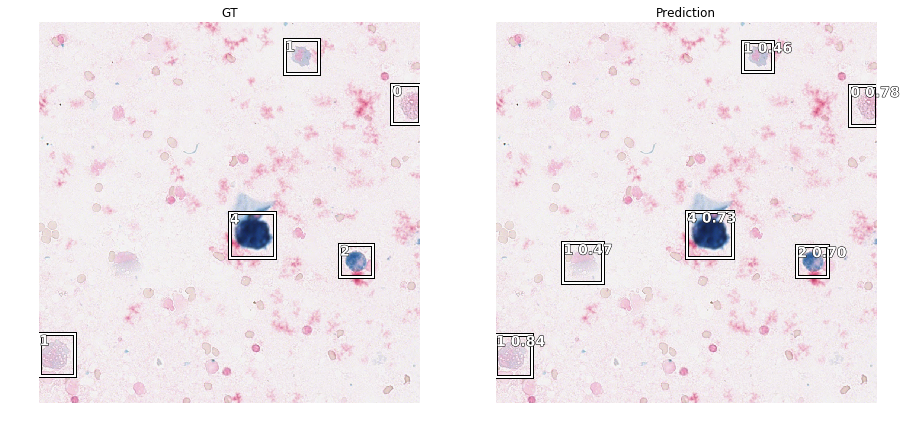

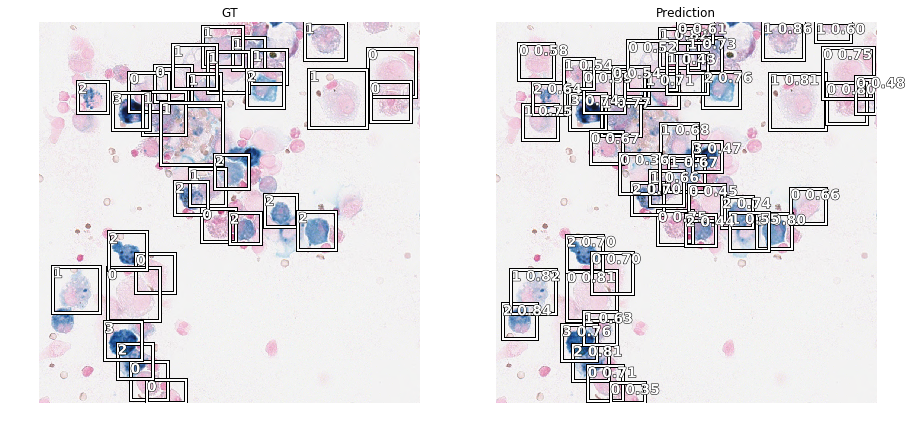

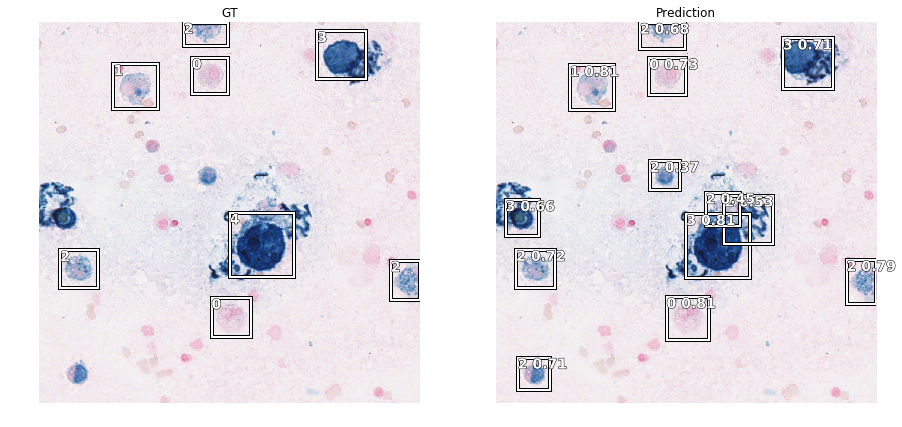

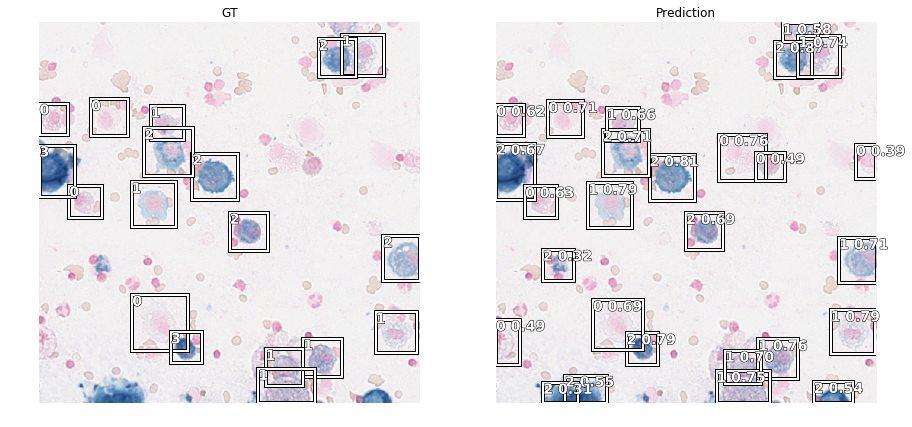

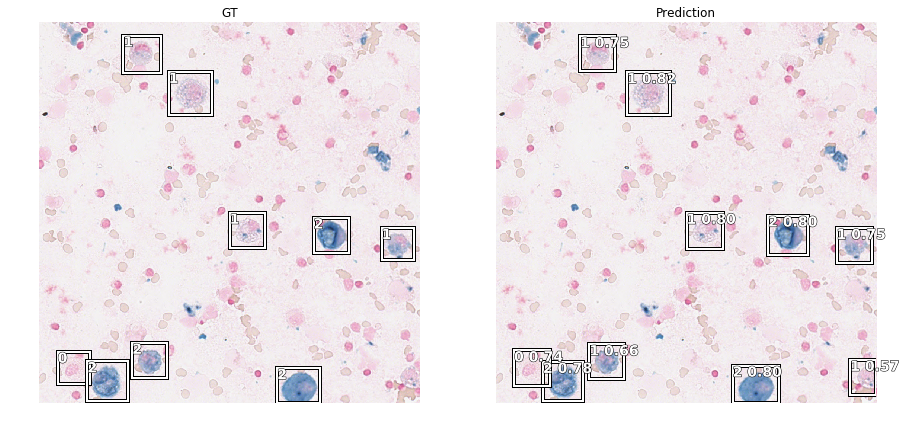

...

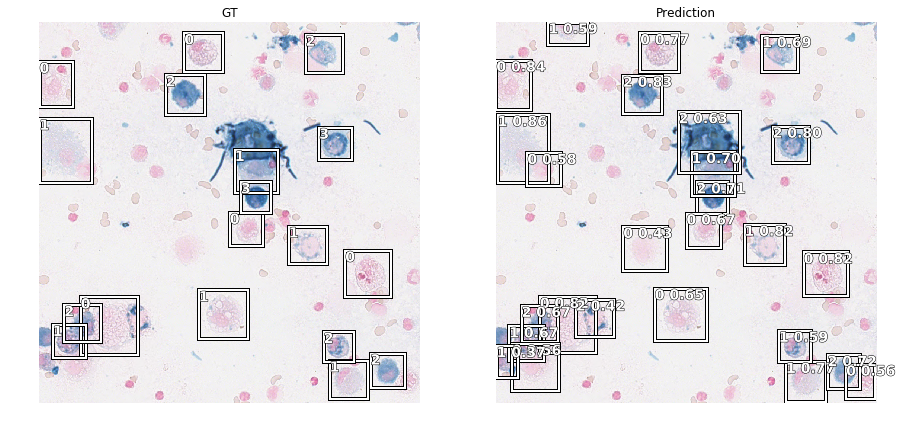

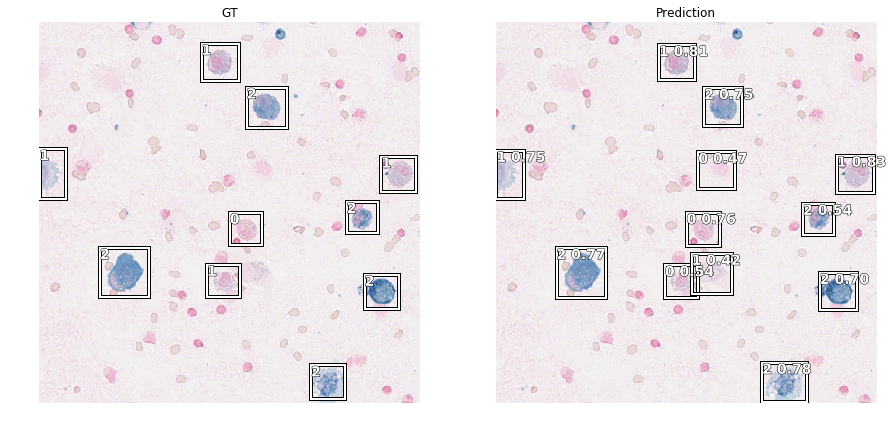

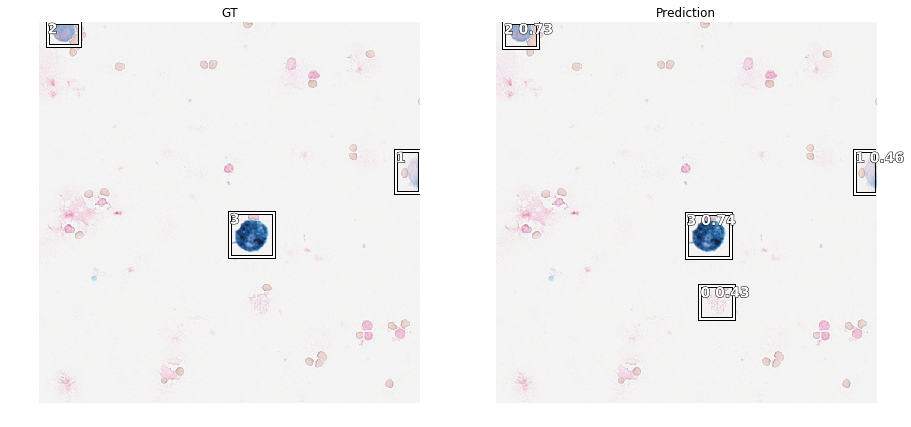

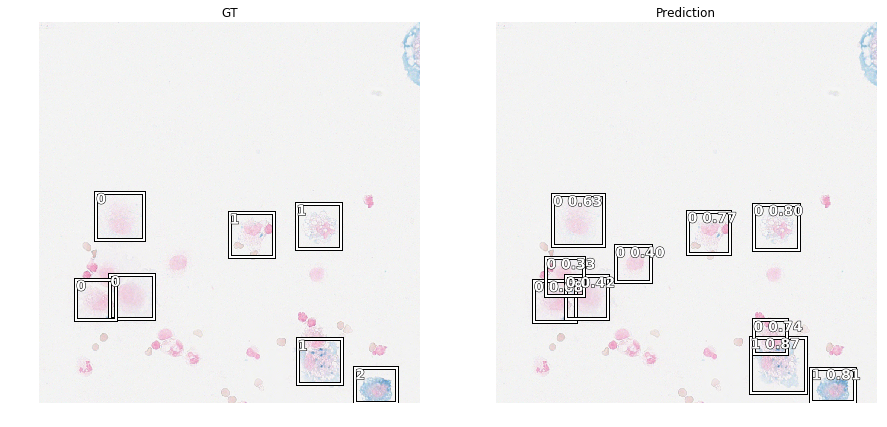

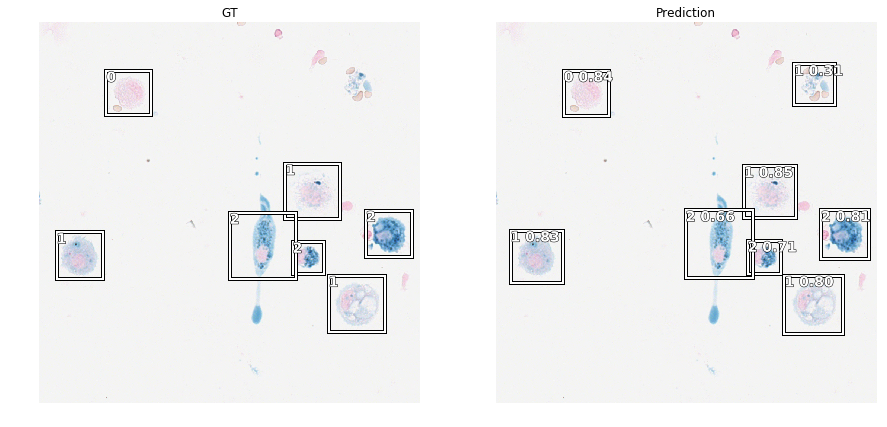

In [23]:
slide_object_result(learn, anchors, detect_thresh=0.3, nms_thresh=0.2, image_count=20)